<a href="https://colab.research.google.com/github/nuwandianusarani/HireGenius/blob/IT21467448-Cv-Shortlisting-and-Initial-Screening/Stacked_Essemble_model_with_Different_Software_Engineering_Positions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Step 1: Import Necessary Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.ensemble import StackingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import joblib

# Step 2: Load the Dataset
from google.colab import files
uploaded = files.upload()

dataset_path = next(iter(uploaded.keys()))  # Get the uploaded file name
df = pd.read_csv(dataset_path)

# Step 3: Data Exploration
print("\nDataset Preview:")
print(df.head())

print("\nDataset Info:")
print(df.info())

print("\nMissing Values:")
print(df.isnull().sum())

# Step 4: Data Visualization for EDA
print("\nStatistical Summary:")
print(df.describe())

plt.figure(figsize=(15, 8))
sns.heatmap(df.select_dtypes(include=[np.number]).corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

plt.figure(figsize=(8, 5))
sns.histplot(df['Matching Percentage'], kde=True, bins=30, color='blue')
plt.title("Distribution of Matching Percentage")
plt.xlabel("Matching Percentage")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(8, 5))
sns.boxplot(x="No of Years of Working Experience", y="Matching Percentage", data=df)
plt.title("Years of Experience vs Matching Percentage")
plt.show()

sns.pairplot(df.select_dtypes(include=[np.number]))
plt.show()

plt.figure(figsize=(10, 5))
sns.countplot(y='Specialization', data=df, order=df['Specialization'].value_counts().index)
plt.title("Specializations Distribution")
plt.show()

# Step 5: Data Cleaning and Feature Engineering
# Drop irrelevant columns
df.drop(['Candidate Id'], axis=1, inplace=True)

# One-hot encode categorical variables, including 'Position'
df = pd.get_dummies(df, columns=['Education Level', 'Specialization', 'University', 'Position'], drop_first=True)

print("\nProcessed Data (first 5 rows):")
print(df.head())

# Step 6: Splitting the Data
X = df.drop('Matching Percentage', axis=1)
y = df['Matching Percentage']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 7: Train Individual Models
linear_reg = LinearRegression()
knn_reg = KNeighborsRegressor(n_neighbors=5)
dt_reg = DecisionTreeRegressor(random_state=42)
svr_rbf = SVR(kernel='rbf')
svr_linear = SVR(kernel='linear')
rf_reg = RandomForestRegressor(random_state=42, n_estimators=100)
xgb_reg = xgb.XGBRegressor(random_state=42, n_estimators=100)

# Step 8: Create and Train the Stacking Model
base_models = [
    ('Linear Regression', linear_reg),
    ('KNN Regression', knn_reg),
    ('Decision Tree Regression', dt_reg),
    ('SVR RBF', svr_rbf),
    ('SVR Linear', svr_linear),
    ('Random Forest', rf_reg),
    ('XGBoost', xgb_reg)
]
stacked_reg = StackingRegressor(estimators=base_models, final_estimator=LinearRegression(), cv=5)
stacked_reg.fit(X_train, y_train)

# Step 9: Evaluate the Stacked Model
y_pred = stacked_reg.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"\nModel Evaluation Metrics:")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R2): {r2}")

cv_score = cross_val_score(stacked_reg, X, y, cv=5, scoring='r2')
print(f"Cross-Validation R2 Score: {cv_score.mean()}")

# Step 10: Save the Model
joblib.dump(stacked_reg, 'stacked_model_with_position.pkl')
print("Model saved as 'stacked_model_with_position.pkl'")

# Step 11: Test the Model with a Sample Input
sample_input = pd.DataFrame([{
    "No of Years of Working Experience": 3,
    "Previously Worked Companies Roles marks": 85,
    "No of Programming Languages": 6,
    "No of Programming Frameworks": 10,
    "No Software Development Methodologies": 5,
    "No Web Development technologies": 7,
    "Database Technologies": 6,
    "Version Controlling": 8,
    "Courses & Certifications Matching Percentage": 90,
    "Achievements Matching Percentage": 85,
    "Work Experience Matching Percentage": 80,
    "Projects Matching Percentage": 88,
    "Cloud Technologies": 8,
    "CI/CD Technologies": 10,
    **dict.fromkeys(df.filter(like='Education Level_').columns, 0),
    **dict.fromkeys(df.filter(like='Specialization_').columns, 0),
    **dict.fromkeys(df.filter(like='University_').columns, 0),
    **dict.fromkeys(df.filter(like='Position_').columns, 0)
}])
sample_input["Education Level_BSc"] = 1
sample_input["Specialization_Software Engineering"] = 1
sample_input["University_SLIIT"] = 1
sample_input["Position_Software Engineer"] = 1

predicted_matching_percentage = stacked_reg.predict(sample_input)
print(f"\nPredicted Matching Percentage for Sample Input: {predicted_matching_percentage[0]}")


In [ ]:
# Step 1: Import Necessary Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.ensemble import StackingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import joblib

In [ ]:
# Step 2: Load the Dataset
from google.colab import files
uploaded = files.upload()

dataset_path = next(iter(uploaded.keys()))  # Get the uploaded file name
df = pd.read_csv(dataset_path)

Saving candidateScores.csv to candidateScores.csv


In [ ]:
# Step 3: Data Exploration
# Display first few rows of the dataset
print("\nDataset Preview:")
print(df.head())


Dataset Preview:
  Candidate Id           Position  No of Years of Working Experience  \
0    CAD000001  Software Engineer                                2.0   
1    CAD000002  Software Engineer                                4.0   
2    CAD000003  Software Engineer                                4.0   
3    CAD000004  Software Engineer                                2.0   
4    CAD000005  Software Engineer                                4.0   

   Previously Worked Companies Roles marks Education Level  \
0                                    98.43             MSc   
1                                    73.96             BSc   
2                                    65.41             BSc   
3                                    24.42             BSc   
4                                    62.52             BSc   

                              Specialization              University  \
0                       Software Engineering                   SLIIT   
1  Computer Science and Software

In [ ]:
# Check dataset info
print("\nDataset Info:")
print(df.info())


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3001 entries, 0 to 3000
Data columns (total 20 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Candidate Id                                  3001 non-null   object 
 1   Position                                      3000 non-null   object 
 2   No of Years of Working Experience             3000 non-null   float64
 3   Previously Worked Companies Roles marks       3000 non-null   float64
 4   Education Level                               3000 non-null   object 
 5   Specialization                                3000 non-null   object 
 6   University                                    3000 non-null   object 
 7   No of Programming Languages                   3000 non-null   float64
 8   No of Programming Frameworks                  3000 non-null   float64
 9   No Software Development Methodologies         30

In [ ]:
# Check for missing values
print("\nMissing Values:")
print(df.isnull().sum())


Missing Values:
Candidate Id                                    0
Position                                        1
No of Years of Working Experience               1
Previously Worked Companies Roles marks         1
Education Level                                 1
Specialization                                  1
University                                      1
No of Programming Languages                     1
No of Programming Frameworks                    1
No Software Development Methodologies           1
No Web Development technologies                 1
Database Technologies                           1
Version Controlling                             1
Courses & Certifications Matching Percentage    1
Achievements Matching Percentage                1
Work Experience Matching Percentage             1
Projects Matching Percentage                    1
Cloud Technologies                              1
CI/CD Technologies                              1
Matching Percentage              

In [ ]:
# Display rows with missing values
missing_rows = df[df.isnull().any(axis=1)]
print("\nRows with Missing Values:")
print(missing_rows)



Rows with Missing Values:
     Candidate Id Position  No of Years of Working Experience  \
3000                  NaN                                NaN   

      Previously Worked Companies Roles marks Education Level Specialization  \
3000                                      NaN             NaN            NaN   

     University  No of Programming Languages  No of Programming Frameworks  \
3000        NaN                          NaN                           NaN   

      No Software Development Methodologies  No Web Development technologies  \
3000                                    NaN                              NaN   

      Database Technologies  Version Controlling  \
3000                    NaN                  NaN   

      Courses & Certifications Matching Percentage  \
3000                                           NaN   

      Achievements Matching Percentage  Work Experience Matching Percentage  \
3000                               NaN                                

In [ ]:
# Get the indices of rows with missing values
missing_indices = df[df.isnull().any(axis=1)].index
print("\nIndices of Rows with Missing Values:")
print(missing_indices)



Indices of Rows with Missing Values:
Index([3000], dtype='int64')


In [ ]:
# Step 4: Data Preprocessing
# Fill missing values
for col in df.columns:
    if df[col].dtype == 'object':  # Categorical columns
        df[col].fillna(df[col].mode()[0], inplace=True)
    else:  # Numerical columns
        df[col].fillna(df[col].mean(), inplace=True)

print("\nMissing Values After Imputation:")
print(df.isnull().sum())


Missing Values After Imputation:
Candidate Id                                    0
Position                                        0
No of Years of Working Experience               0
Previously Worked Companies Roles marks         0
Education Level                                 0
Specialization                                  0
University                                      0
No of Programming Languages                     0
No of Programming Frameworks                    0
No Software Development Methodologies           0
No Web Development technologies                 0
Database Technologies                           0
Version Controlling                             0
Courses & Certifications Matching Percentage    0
Achievements Matching Percentage                0
Work Experience Matching Percentage             0
Projects Matching Percentage                    0
Cloud Technologies                              0
CI/CD Technologies                              0
Matching Percent

<ipython-input-8-a44d714345d0>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mode()[0], inplace=True)
<ipython-input-8-a44d714345d0>:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using '

In [ ]:
print(df.loc[3000])


Candidate Id                                                              
Position                                        Associate Software Engineer
No of Years of Working Experience                                  1.818667
Previously Worked Companies Roles marks                            50.32498
Education Level                                                         BSc
Specialization                                         Software Engineering
University                                           University of Moratuwa
No of Programming Languages                                           5.846
No of Programming Frameworks                                       8.037667
No Software Development Methodologies                              4.055333
No Web Development technologies                                    5.144333
Database Technologies                                              5.529333
Version Controlling                                                5.426223
Courses & Ce

In [ ]:
# Step 4: Data Visualization for EDA
# Statistical Summary
print("\nStatistical Summary:")
print(df.describe())


Statistical Summary:
       No of Years of Working Experience  \
count                        3001.000000   
mean                            1.818667   
std                             1.404915   
min                             0.000000   
25%                             1.000000   
50%                             1.000000   
75%                             3.000000   
max                             5.000000   

       Previously Worked Companies Roles marks  No of Programming Languages  \
count                              3001.000000                  3001.000000   
mean                                 50.324980                     5.846000   
std                                  28.306447                     1.494752   
min                                   1.040000                     4.000000   
25%                                  25.940000                     5.000000   
50%                                  50.090000                     6.000000   
75%                         

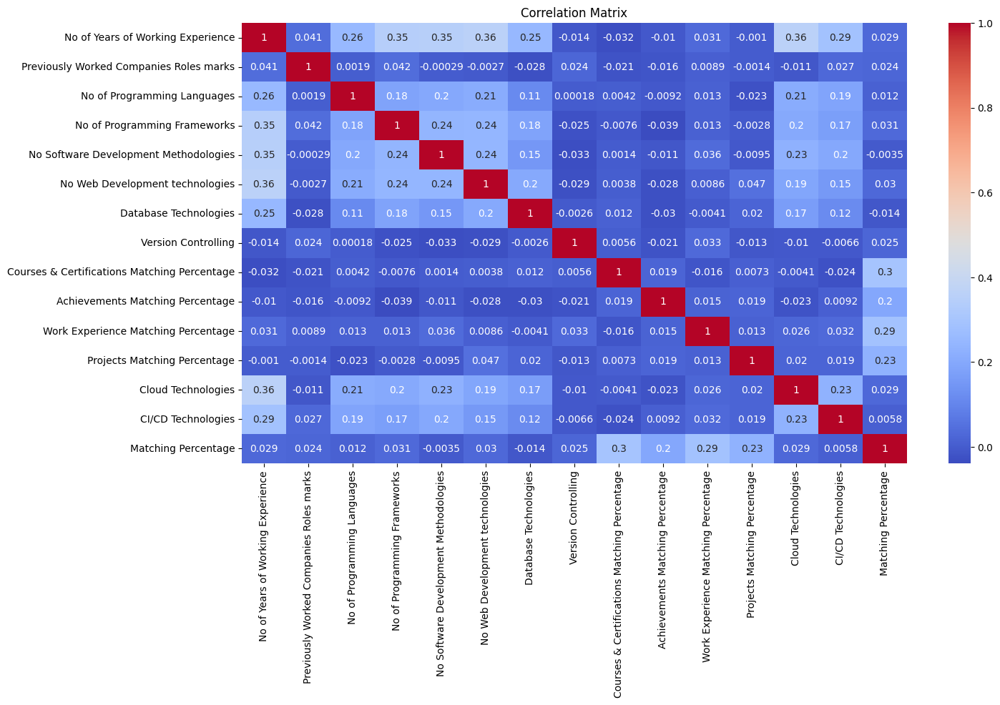

In [ ]:
# Correlation Matrix Heatmap
plt.figure(figsize=(15, 8))
sns.heatmap(df.select_dtypes(include=[np.number]).corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

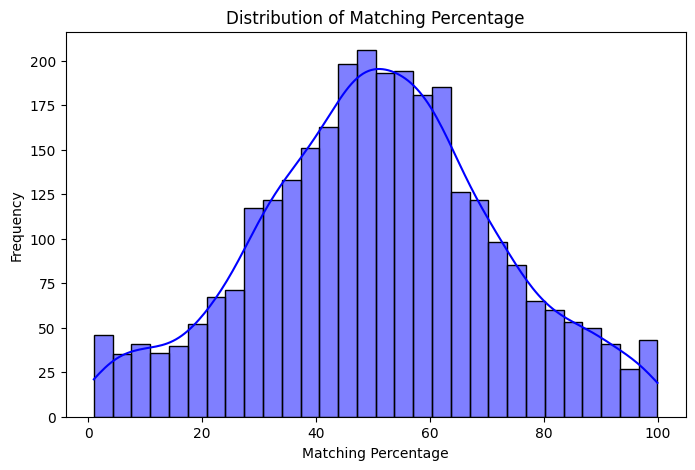

In [ ]:
# Distribution of Target Variable
plt.figure(figsize=(8, 5))
sns.histplot(df['Matching Percentage'], kde=True, bins=30, color='blue')
plt.title("Distribution of Matching Percentage")
plt.xlabel("Matching Percentage")
plt.ylabel("Frequency")
plt.show()

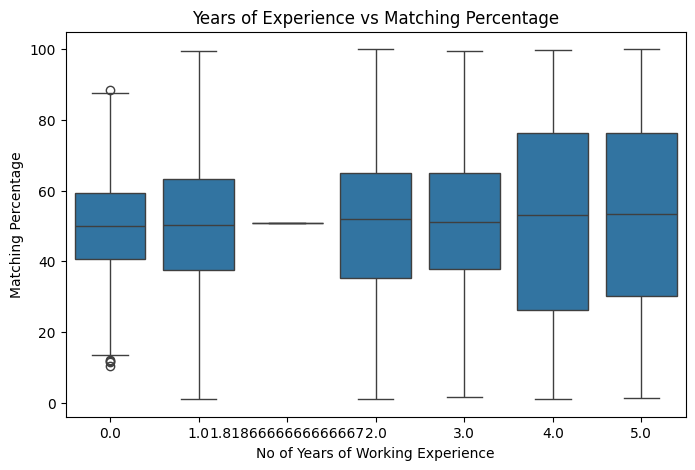

In [ ]:
# Boxplot: Years of Experience vs Matching Percentage
plt.figure(figsize=(8, 5))
sns.boxplot(x="No of Years of Working Experience", y="Matching Percentage", data=df)
plt.title("Years of Experience vs Matching Percentage")
plt.show()

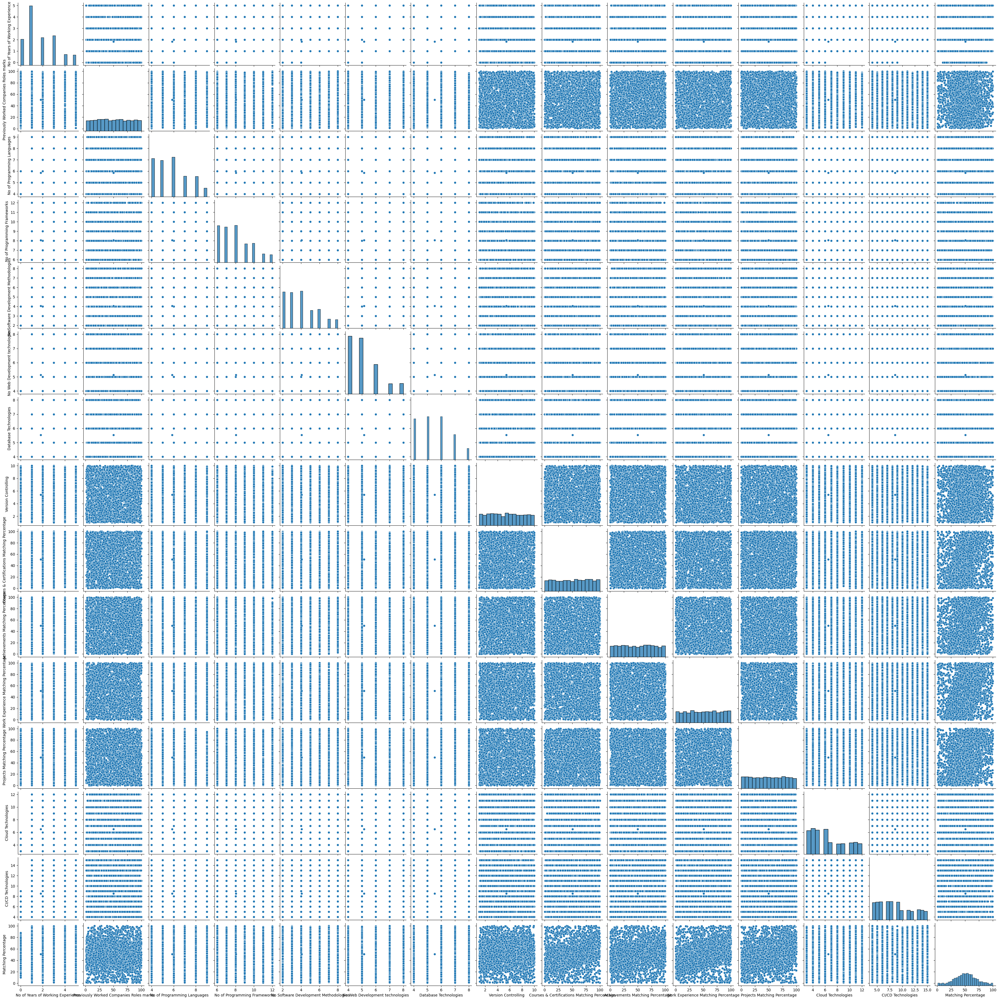

In [ ]:
# Pairplot of Numerical Features
sns.pairplot(df.select_dtypes(include=[np.number]))
plt.show()

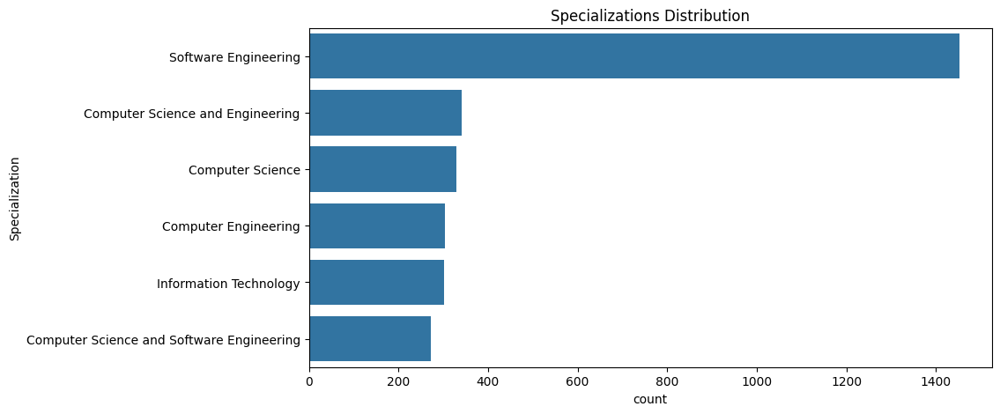

In [ ]:
# Bar Plot: Specializations Count
plt.figure(figsize=(10, 5))
sns.countplot(y='Specialization', data=df, order=df['Specialization'].value_counts().index)
plt.title("Specializations Distribution")
plt.show()

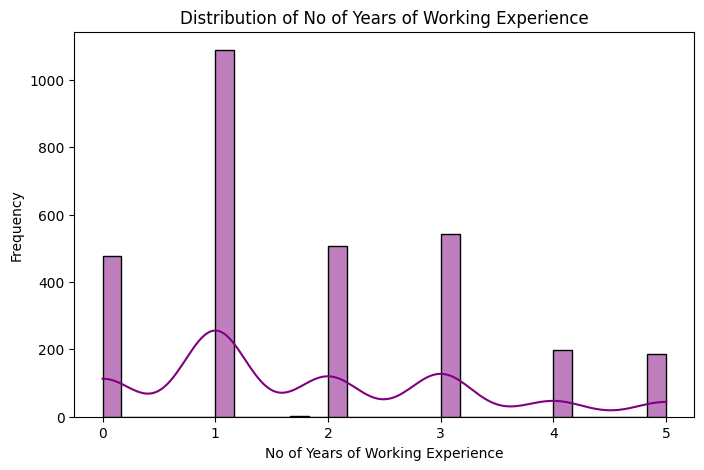

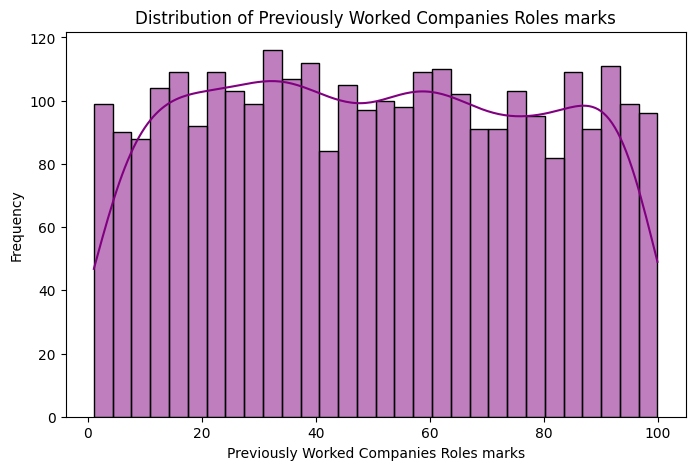

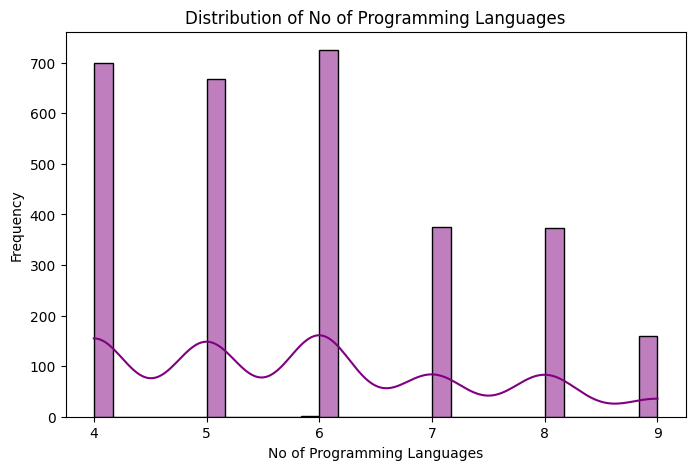

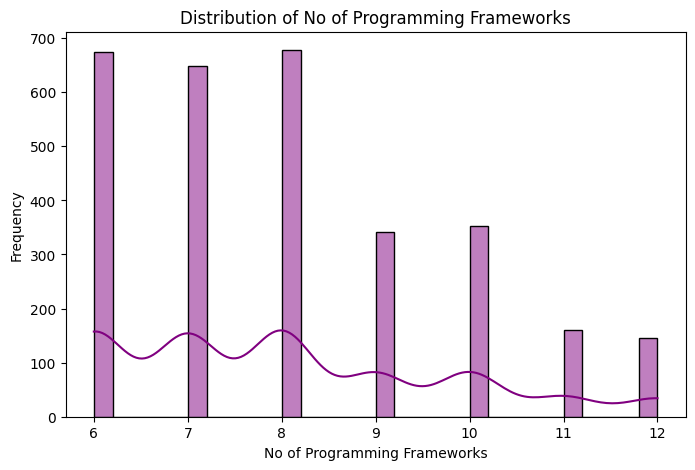

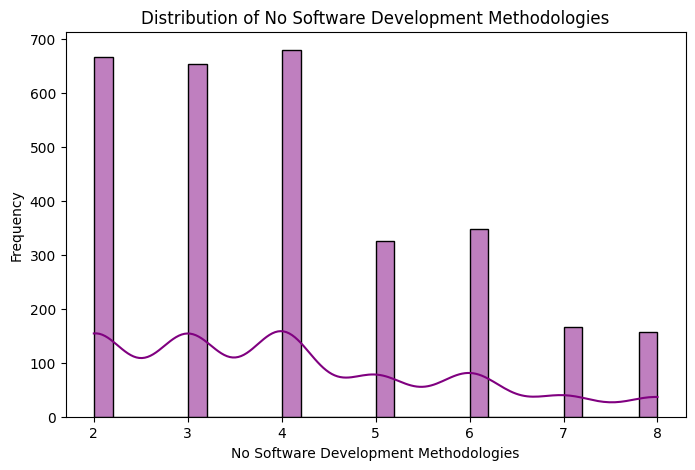

...

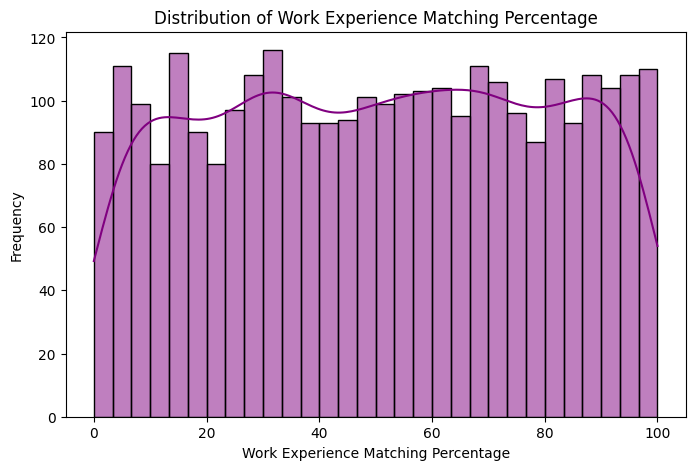

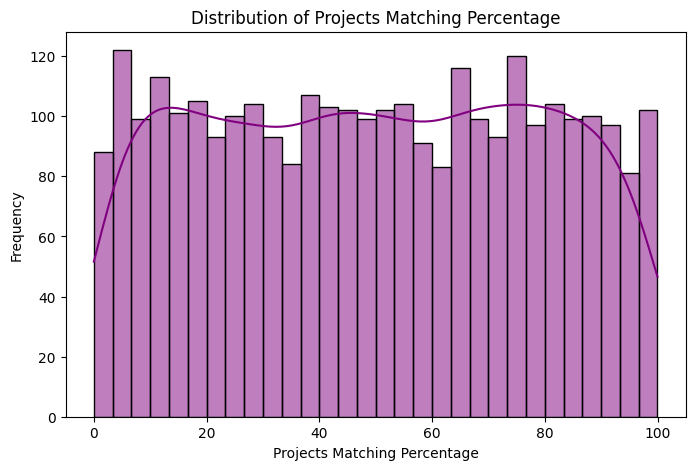

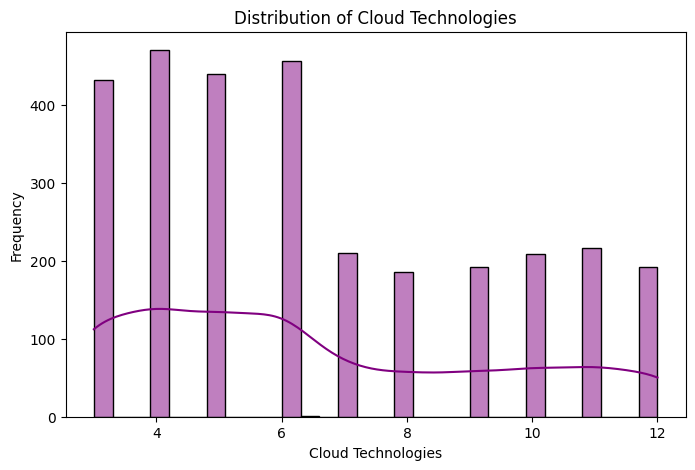

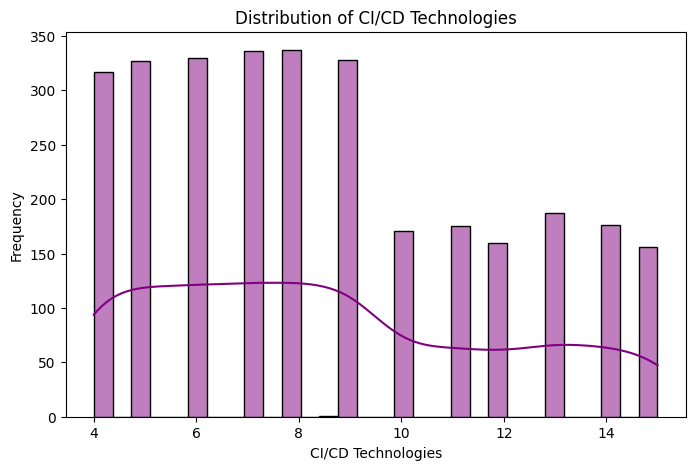

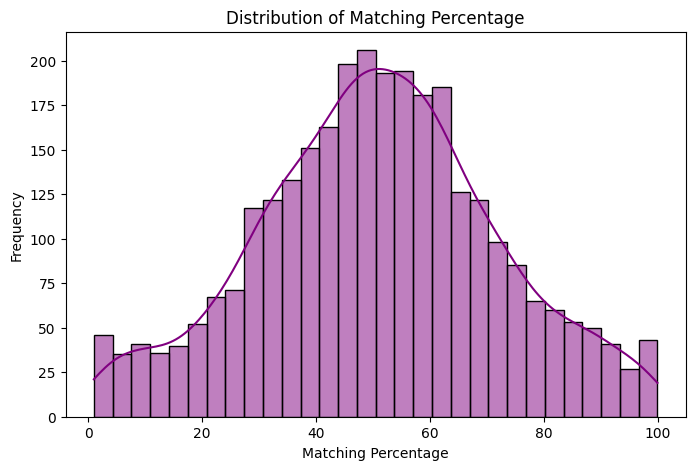

In [ ]:
numeric_columns = df.select_dtypes(include=[np.number]).columns

# 1. Distribution of numeric columns
for col in numeric_columns:
    plt.figure(figsize=(8, 5))
    sns.histplot(df[col], kde=True, bins=30, color='purple')
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

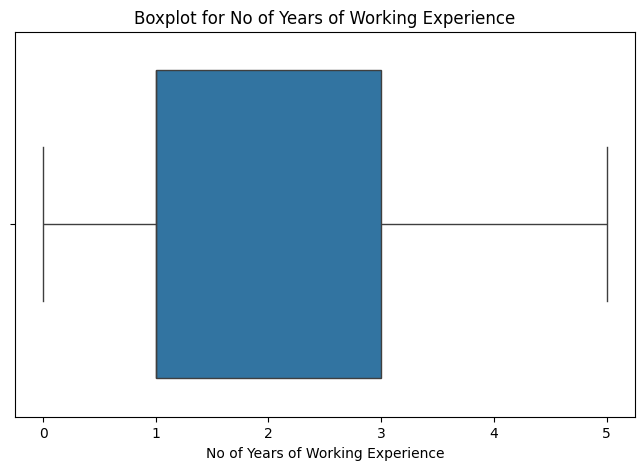

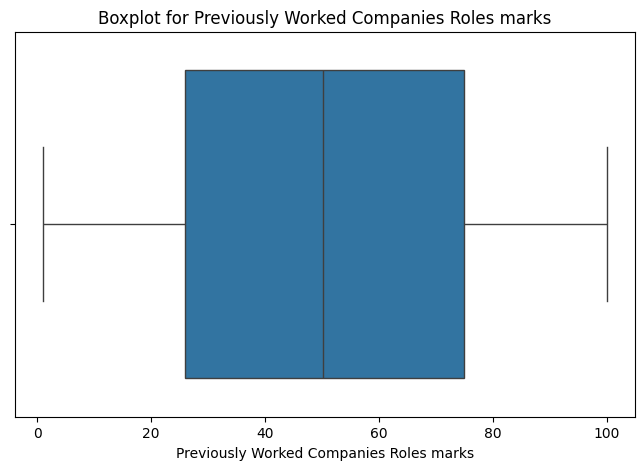

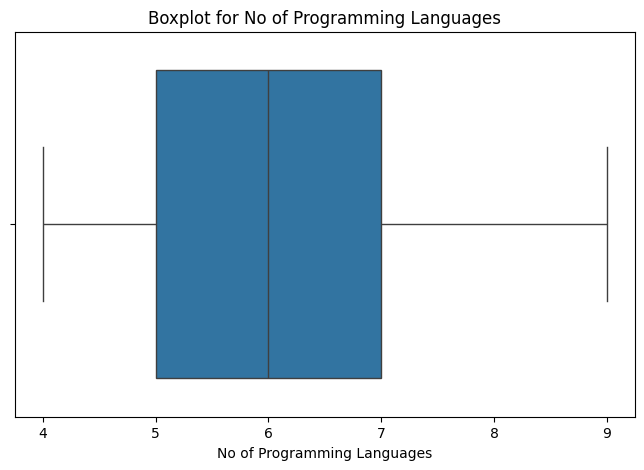

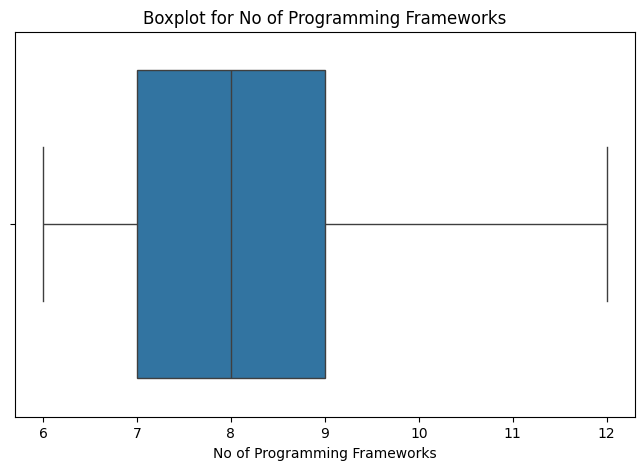

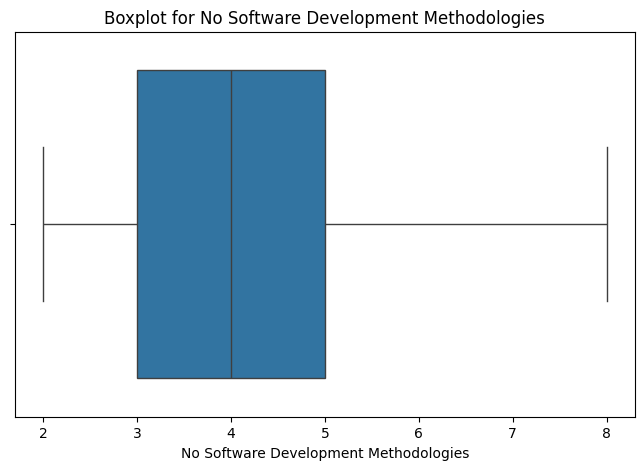

...

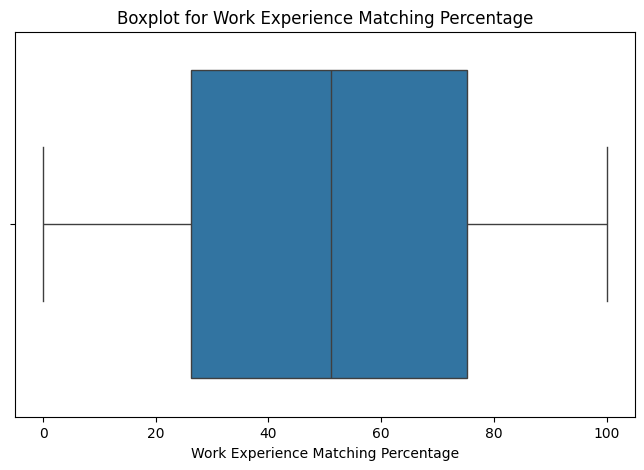

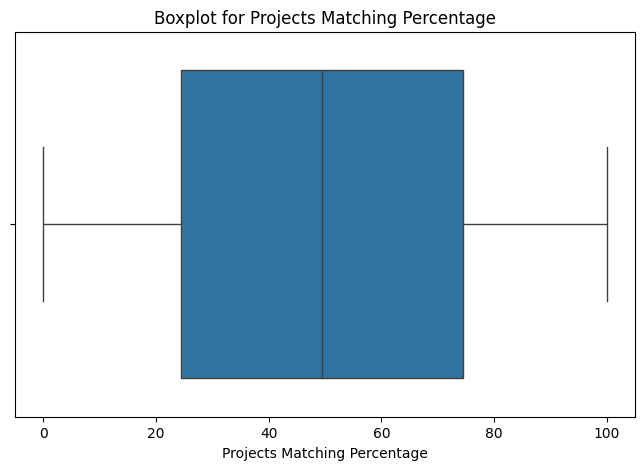

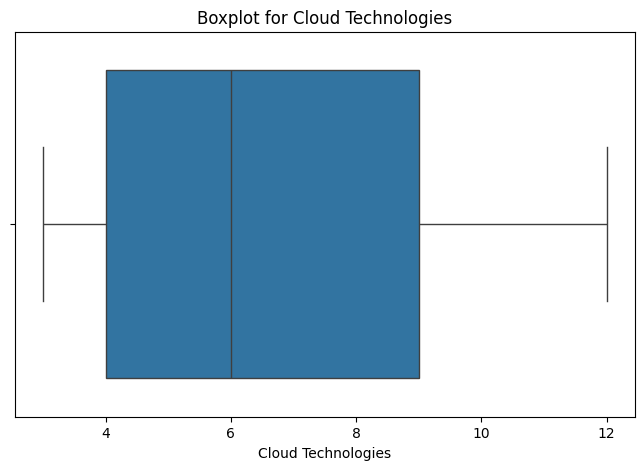

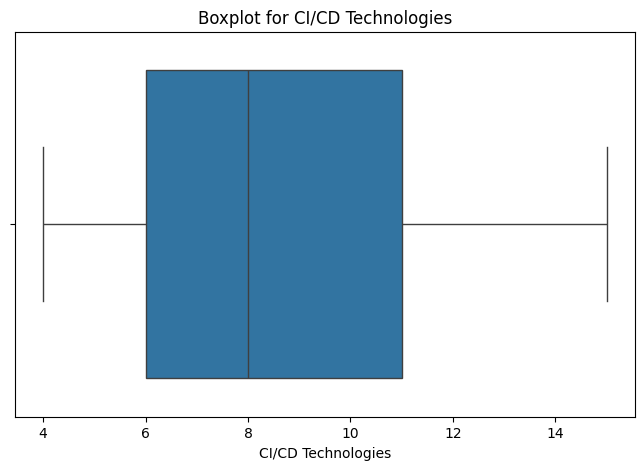

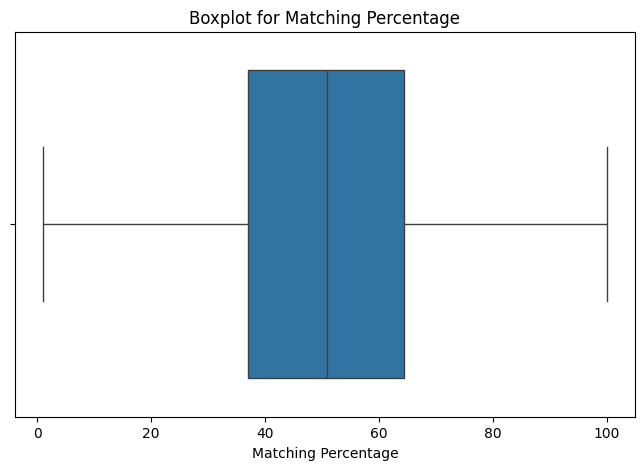

In [ ]:
# 2. Boxplots for numeric columns to visualize outliers
for col in numeric_columns:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot for {col}")
    plt.show()

<ipython-input-20-129874b53a02>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, order=df[col].value_counts().index, palette="viridis")
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 26 () missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


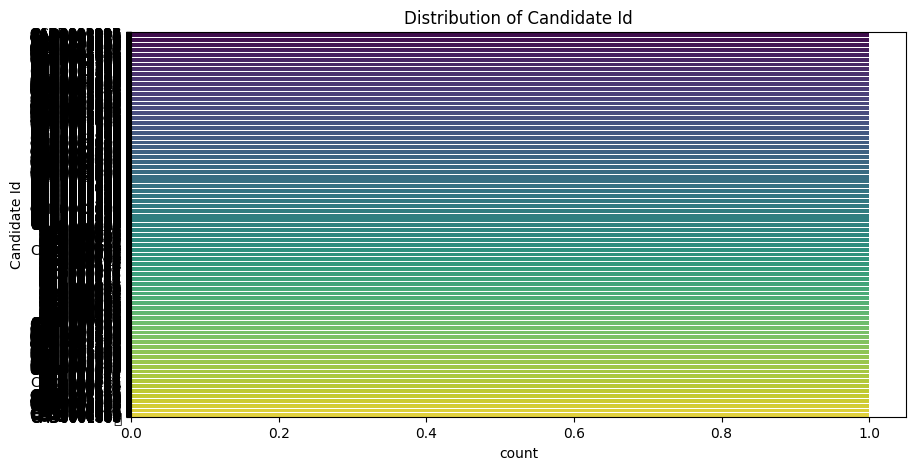

<ipython-input-20-129874b53a02>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, order=df[col].value_counts().index, palette="viridis")


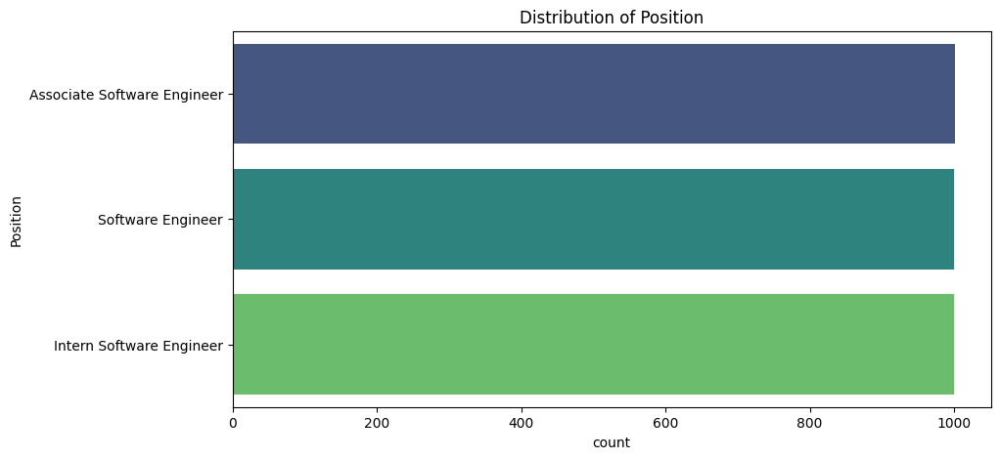

<ipython-input-20-129874b53a02>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, order=df[col].value_counts().index, palette="viridis")


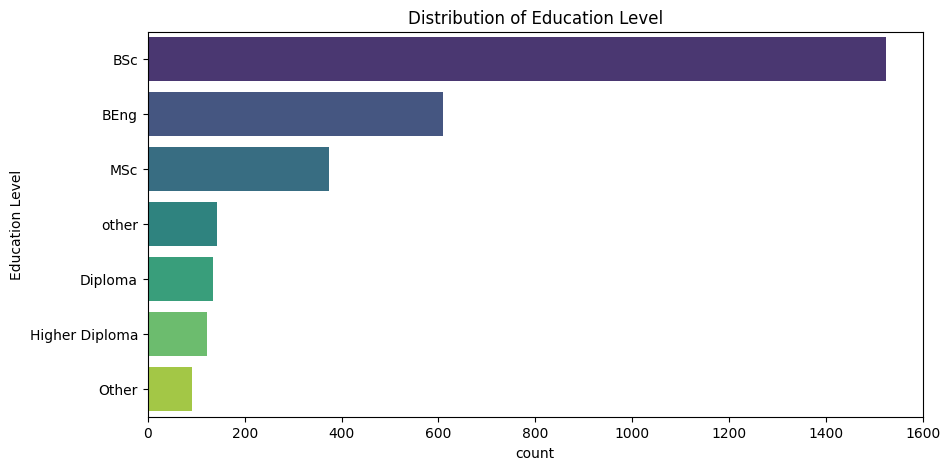

<ipython-input-20-129874b53a02>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, order=df[col].value_counts().index, palette="viridis")


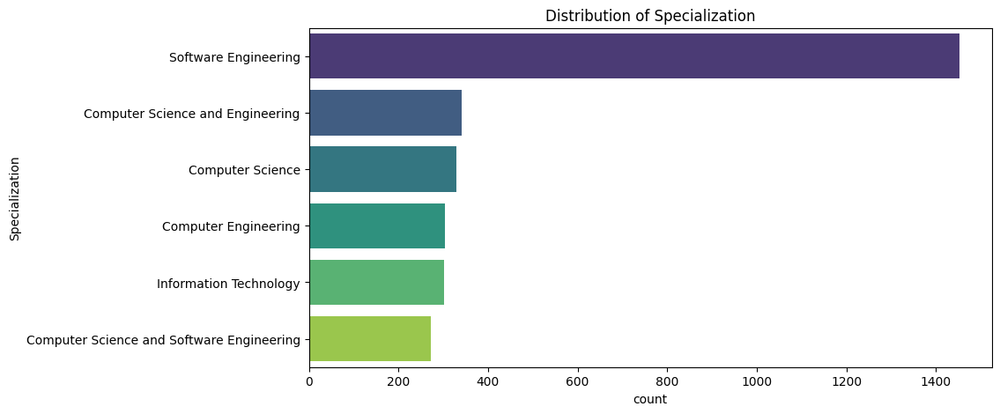

<ipython-input-20-129874b53a02>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, order=df[col].value_counts().index, palette="viridis")


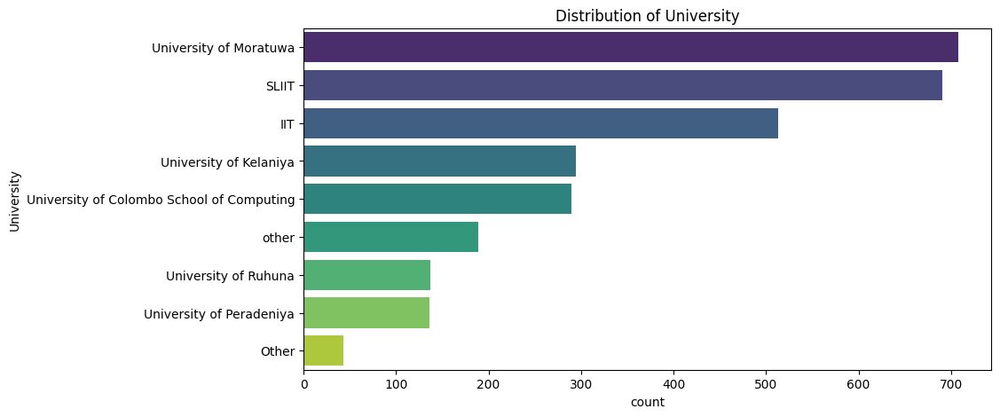

In [ ]:
# 3. Bar plot for categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
for col in categorical_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=col, data=df, order=df[col].value_counts().index, palette="viridis")
    plt.title(f"Distribution of {col}")
    plt.show()

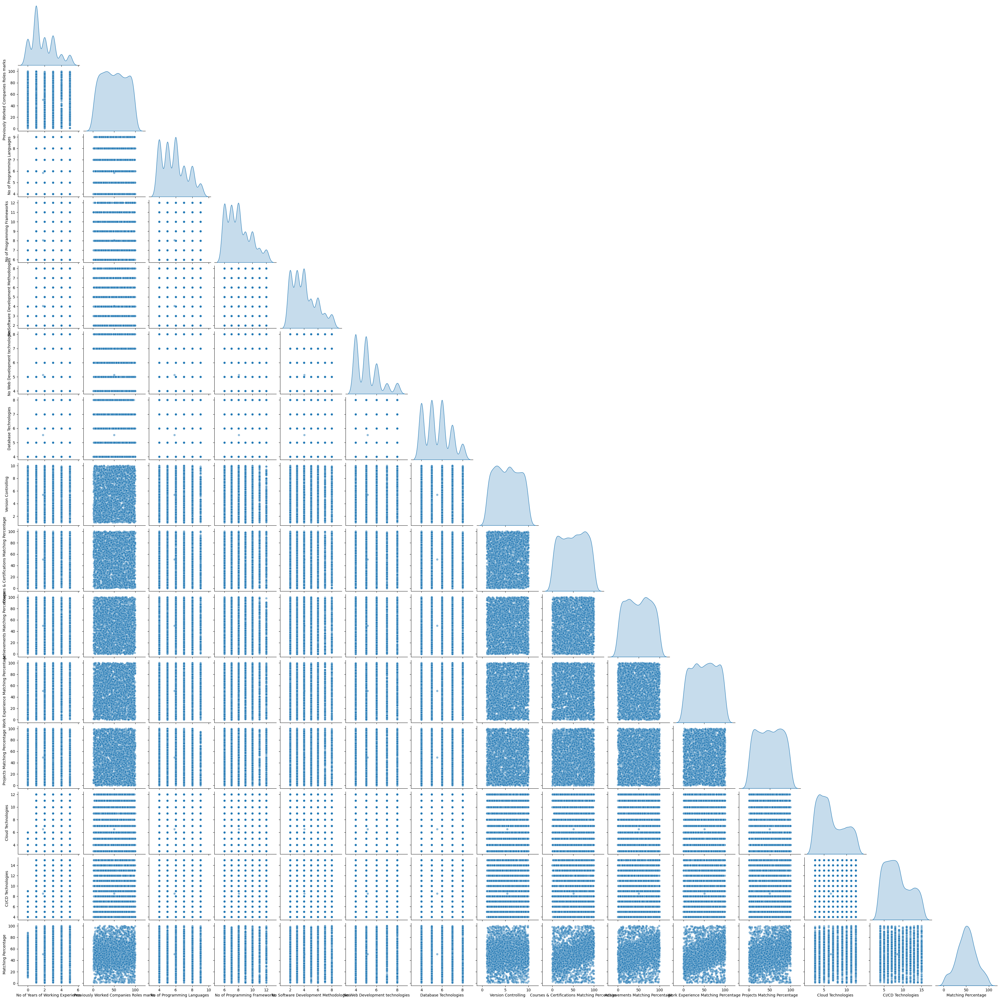

In [ ]:
# 4. Pairplot for feature relationships
sns.pairplot(df, diag_kind='kde', corner=True, plot_kws={'alpha': 0.5})
plt.show()

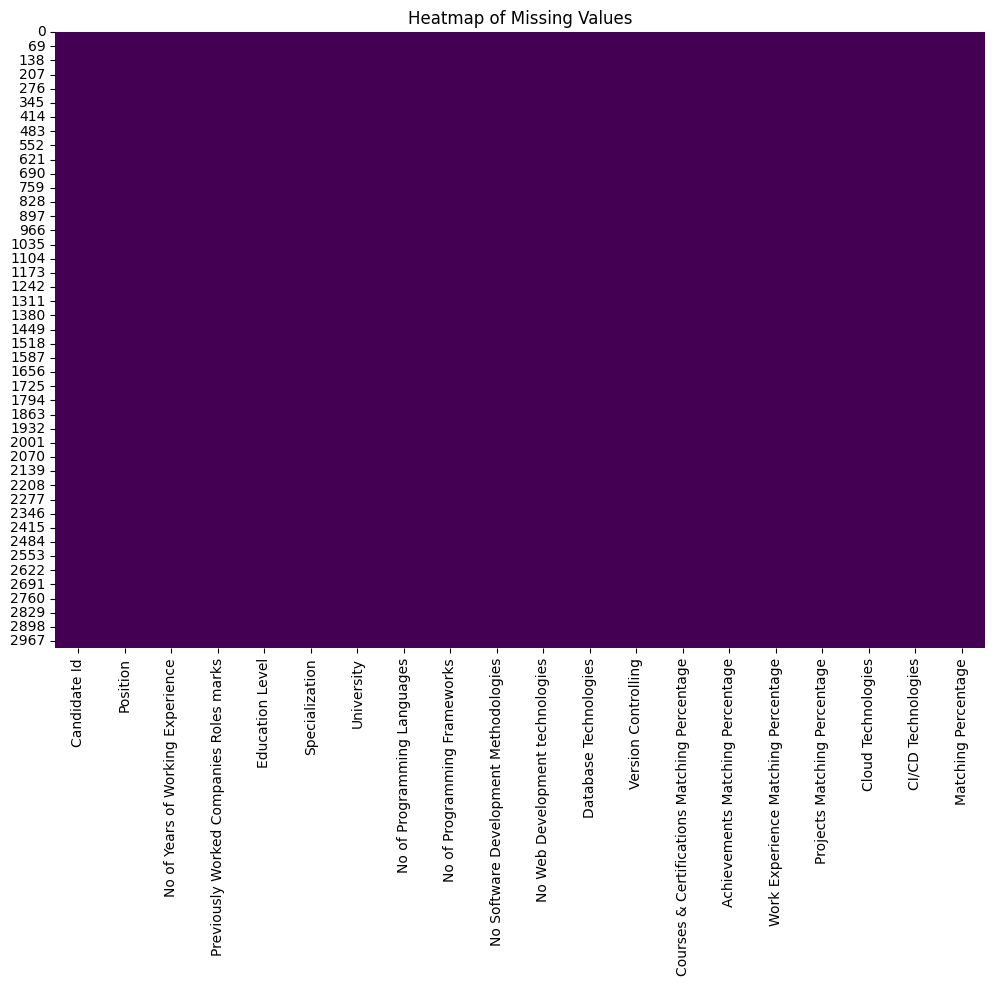

In [ ]:
# 5. Heatmap for missing values
plt.figure(figsize=(12, 8))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Heatmap of Missing Values")
plt.show()

In [ ]:
# 6. Violin plots for numeric columns grouped by a category (e.g., Position)
if 'position' in df.columns:
    for col in numeric_columns:
        plt.figure(figsize=(10, 6))
        sns.violinplot(x='position', y=col, data=df, palette="muted")
        plt.title(f"{col} Distribution by Position")
        plt.show()

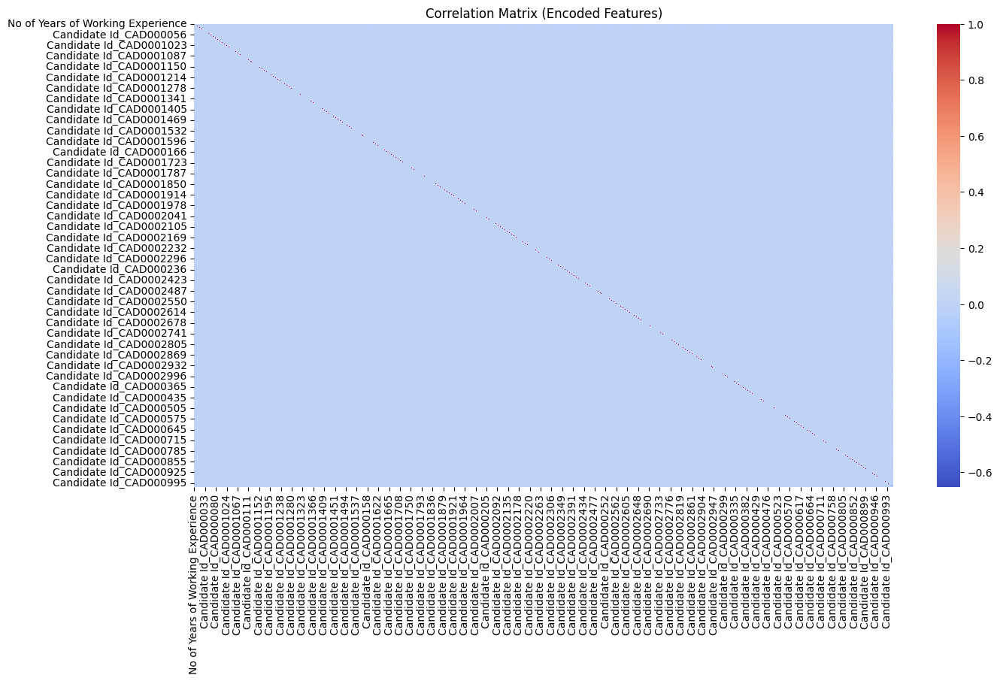

In [ ]:
# 7. Advanced correlation matrix with categorical encoding
encoded_df = pd.get_dummies(df, drop_first=True)
plt.figure(figsize=(15, 8))
sns.heatmap(encoded_df.corr(), annot=False, cmap="coolwarm", cbar=True)
plt.title("Correlation Matrix (Encoded Features)")
plt.show()

In [ ]:
# Step 5: Data Cleaning and Feature Engineering
# Drop irrelevant columns
df.drop(['Candidate Id'], axis=1, inplace=True)

# One-hot encode categorical variables, including 'Position'
df = pd.get_dummies(df, columns=['Education Level', 'Specialization', 'University', 'Position'], drop_first=True)

print("\nProcessed Data (first 5 rows):")
print(df.head())


Processed Data (first 5 rows):
   No of Years of Working Experience  Previously Worked Companies Roles marks  \
0                                2.0                                    98.43   
1                                4.0                                    73.96   
2                                4.0                                    65.41   
3                                2.0                                    24.42   
4                                4.0                                    62.52   

   No of Programming Languages  No of Programming Frameworks  \
0                          9.0                           8.0   
1                          4.0                           9.0   
2                          5.0                          12.0   
3                          9.0                          10.0   
4                          4.0                          11.0   

   No Software Development Methodologies  No Web Development technologies  \
0                  

In [ ]:
# Step 6: Splitting the Data
X = df.drop('Matching Percentage', axis=1)
y = df['Matching Percentage']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Step 7: Train Individual Models
linear_reg = LinearRegression()
knn_reg = KNeighborsRegressor(n_neighbors=5)
dt_reg = DecisionTreeRegressor(random_state=42)
svr_rbf = SVR(kernel='rbf')
svr_linear = SVR(kernel='linear')
rf_reg = RandomForestRegressor(random_state=42, n_estimators=100)
xgb_reg = xgb.XGBRegressor(random_state=42, n_estimators=100)

In [ ]:
# Step 8: Create and Train the Stacking Model
base_models = [
    ('Linear Regression', linear_reg),
    ('KNN Regression', knn_reg),
    ('Decision Tree Regression', dt_reg),
    ('SVR RBF', svr_rbf),
    ('SVR Linear', svr_linear),
    ('Random Forest', rf_reg),
    ('XGBoost', xgb_reg)
]
stacked_reg = StackingRegressor(estimators=base_models, final_estimator=LinearRegression(), cv=5)
stacked_reg.fit(X_train, y_train)

StackingRegressor(cv=5,
                  estimators=[('Linear Regression', LinearRegression()),
                              ('KNN Regression', KNeighborsRegressor()),
                              ('Decision Tree Regression',
                               DecisionTreeRegressor(random_state=42)),
                              ('SVR RBF', SVR()),
                              ('SVR Linear', SVR(kernel='linear')),
                              ('Random Forest',
                               RandomForestRegressor(random_state=42)),
                              ('XGBoost',
                               XGBRegressor(base_score=None, booster=None,
                                            callback...
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=42, ...))],
                  final_estimator=LinearRegression())

In [ ]:
  # Step 9: Evaluate the Stacked Model
y_pred = stacked_reg.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"\nModel Evaluation Metrics:")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R2): {r2}")

cv_score = cross_val_score(stacked_reg, X, y, cv=5, scoring='r2')
print(f"Cross-Validation R2 Score: {cv_score.mean()}")





Model Evaluation Metrics:
Mean Absolute Error (MAE): 10.998186553960565
Mean Squared Error (MSE): 325.832968464246
Root Mean Squared Error (RMSE): 18.050843982048207
R-squared (R2): 0.27975585836721184


KeyboardInterrupt: 

In [ ]:
 # Evaluate on Training Data
y_train_pred = stacked_reg.predict(X_train)
train_r2 = r2_score(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))

print("\nTraining Data Evaluation:")
print(f"R-squared (R2): {train_r2}")
print(f"Root Mean Squared Error (RMSE): {train_rmse}")

# Evaluate on Test Data (already calculated)
print("\nTest Data Evaluation:")
print(f"R-squared (R2): {r2}")
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Cross-validation Score
cv_score = cross_val_score(stacked_reg, X, y, cv=5, scoring='r2')
print(f"Cross-Validation R2 Score: {cv_score.mean()}")


In [ ]:
# Residuals Plot
residuals = y_test - y_pred
plt.figure(figsize=(8, 5))
sns.histplot(residuals, kde=True, bins=30, color='green')
plt.title("Distribution of Residuals")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()


In [ ]:
accuracy = r2_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")


Accuracy: 27.98%
